---
title: Diffusion based Generative Model
subtitle: Intutive explanation and mathematical theory with simple examples
date: "2023-09-03"
categories: [Generative model, Diffusion model]
toc: true
bibliography: 
    - ref1.bib
    - ref2.bib
    - ref3.bib
    - ref4.bib
    - ref5.bib
    - ref6.bib
    - ref7.bib
    
csl: diabetologia.csl

---


[![](https://colab.research.google.com/assets/colab-badge.svg){fig-align="right"}](https://colab.research.google.com/github/murdenh/nbs/blob/main/diffusion.ipynb)

# Introduction

::: {#fig-intro layout-ncol=2}

![Image AI product (Source: [NVIDIA canvas](https://www.nvidia.com/en-us/studio/canvas/))](nvidia-canvas.gif){#fig-intro1}

![Controlled image generation <br/> (Source: [ControlNet](https://github.com/lllyasviel/ControlNet))](intro.png){#fig-intro2}

Examples of generative AI
:::



Generative AI has become popular through the media and it started becoming a real tool in the industry rather than just a research topic. The advance speed of AI is so fast that many companies started creating a product utilising such AI technologies.

Diffusion model is one of the state-of-art approaches in Generative AI. It is used to generate an image, music, video and any data having an inherent continuity characteristic. Recent image generation products, [Midjourney](https://www.midjourney.com/) and [Dreamstudio](https://dreamstudio.ai/), are all based on the diffusion model.

What is special about the diffusion model? What kind of mathematical background is it based on? What kinds of techinques are used in the diffusion model? Let's go into the details with code examples to answer some of these questions.


<details>
  <summary>Details (Intro)</summary>

Generative models are trying to model the full input data distribution of $p(x)$ whereas discriminative models fit on the conditional label distribution of $p(y|x)$. As a result, it has been more difficult to create a generative model because $x$ that people wanted to generate, was usually a high dimensional unstructured data like image or text that is much more complex than the label distribution of $y$.

Despite the difficulty of creating the high-quality generative models, There has been many attempts to tackle the generative problem with various deep learning approaches.

- **Variational AutoEncoder**: VAE has 2 components: encoder for $p(z|x)$ and decoder for $p(x|z)$. $z$ is called a latent variable or it can be thought as a special hidden state. The model is trained to generate $x$ from $z$ while enforcing $z$ to be normally distributed.

- **Generative Adversarial Network**: GAN also has 2 components: discriminator for $p(IsReal|x)$ and generator for $p(x|z)$. $z$ can be theoretically any distribution that can be sampled from, but normal distribution is usually used. As discriminator's capability to differentiate 'real $x$' from 'generated $x$' is used to train a generator, it is important to train both components adequately and simultaneously in a way that they can co-help each other during training.

- **Normalising flow based model**: This is based on an invertible transformation to change a simple distribution to a more complex one. It creates a sequential process where each sequential step transforms a distribution slightly such that a simple distribution like normal distrubtion is ultimately transformed to the data distribution at the end. Then, the model can be directly optimised to maximise $p(x)$.


So, "Is the diffusion model just another approach?" The answer is Yes, with advantages over the other approaches like being more stable than GAN, more powerful than VAE, not restricted to an invertible transformation like normalising flow models. 
    
</details>

# Background

1. Probability
    - Probability distribution $p(x)$: A function that gives a probability for a possible value $x$
        - Normal distribution: Type of distribution that a noise signal can follow
    - Conditional  probability distribution $p(c|x)$: A probability distribution of c when x is known to be a specific value
    - Sampling from probability distribution $p(x)$: Obtain a real example $x$ following the probabilities of $p(x)$ 
2. Sequence $x_t$: A mathematically related collection of serial numeric objects ($x_1, x_2, ..., x_t$)


In [ ]:
#| code-fold: true
#| code-summary: Command to install dependency libraries

# !pip3 install torch, numpy, matplotlib

In [2]:
#| code-fold: true
#| code-summary: Code (Data)

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import math, gzip, urllib, enum

from torch.utils.data import Dataset, DataLoader
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

# Sample image data
samp1 = b'\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00000000\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00000000\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00000000P\xd0\xf8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00P\xd0\xf8000000\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00P\xd0\xf8P\xd0\xf8P\xd0\xf8\x00\x00\x008Pp8Pp8Pp8Pp\x00\x00\x00P\xd0\xf8P\xd0\xf8P\xd0\xf8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00@\xa0\xc8P\xd0\xf8P\xd0\xf88p\x98@\xa0\xc8P\xd0\xf8P\xd0\xf8@\xa0\xc88p\x98P\xd0\xf8P\xd0\xf8@\xa0\xc8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00@\xa0\xc8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff000@\xa0\xc8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8@\xa0\xc8000\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff000000\x00\x00\x00P\xd0\xf8P\xd0\xf8\xf8\xe8\xe8P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8\xf8\xe8\xe8P\xd0\xf8P\xd0\xf8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff0008p\x98\x00\x00\x008X\xc8P\xd0\xf8\x00\x00\x00P\xd0\xf8P\xd0\xf8P\xd0\xf8P\xd0\xf8\x00\x00\x00P\xd0\xf88X\xc8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff0008p\x988p\x98\x188\x908X\xc8P\xd0\xf8P\xd0\xf88p\x988p\x98P\xd0\xf8P\xd0\xf88X\xc8\x188\x90\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff0008p\x988p\x98000\x00\x00\x00000@\xa0\xc8@\xa0\xc8@\xa0\xc8@\xa0\xc8000\x00\x00\x00000\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff0008p\x988Pp@\xa0\xc88Pp0000000000008Pp@\xa0\xc88Pp8Pp\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff8Pp\x00\x00\x00@\xa0\xc8P\xd0\xf88Pp@\xa0\xc8@\xa0\xc88PpP\xd0\xf8@\xa0\xc8\x00\x00\x008Pp\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff8Pp@\xa0\xc8\x00\x00\x00\x00\x00\x00@\xa0\xc8@\xa0\xc8@\xa0\xc8@\xa0\xc8\x00\x00\x00\x00\x00\x00@\xa0\xc88Pp\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff8Pp@\xa0\xc8@\xa0\xc8@\xa0\xc8@\xa0\xc8@\xa0\xc8@\xa0\xc8@\xa0\xc8@\xa0\xc8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x008p\x98@\xa0\xc8000000000000\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff'
samp2 = b'\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H(Hp\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H(Hp\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H(Hp\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H(Hp\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00(Hp(Hp\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H(Hp(Hp\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x18\xb0\xd0(Hp\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H(Hp\x18\xb0\xd0\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x18\xb0\xd0(Hp\x18(H\x18X\x88\x18X\x88\x18X\x88\x18X\x88\x18X\x88\x18(H(Hp\x18\xb0\xd0\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x18\xb0\xd0(Hp\x00\x00\x00 x\xd0@\xc0\xf8@\xc0\xf8@\xc0\xf8 x\xd0\x00\x00\x00(Hp\x18\xb0\xd0\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x18\xb0\xd0\x18\xb0\xd0(Hp\x00\x00\x00@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8\x00\x00\x00(Hp\x18\xb0\xd0\x18\xb0\xd0\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H\x18(H(Hp\x00\x00\x00@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8\x00\x00\x00(Hp\x18(H\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H\xff\xff\xff\xff\xff\xff\x00\x00\x00@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8\x00\x00\x00\xff\xff\xff\xff\xff\xff\x18(H\x18X\x88\x18X\x88\x18X\x88\x18X\x88\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18X\x88 x\xd0@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8 x\xd0\x18X\x88\xff\xff\xff\xff\xff\xff\x18X\x88\x08\xe0\xf8\x08\xe0\xf8\x08\xe0\xf8\x18X\x88\x18X\x88\x18X\x88\xff\xff\xff\xff\xff\xff\x00\x00\x00 x\xd0@\xc0\xf8\xf8\xe8\xe8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8\xf8\xe8\xe8@\xc0\xf8 x\xd0\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18X\x88\x18\xb0\xd0\x08\xe0\xf8\x08\xe0\xf8\x08\xe0\xf8\x18X\x88\xff\xff\xff\xff\xff\xff\x00\x00\x00\x08\xe0\xf8\x08\xe0\xf8\x00\x00\x00@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8@\xc0\xf8\x00\x00\x00\x08\xe0\xf8\x08\xe0\xf8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18X\x88\x18\xb0\xd0\x08\xe0\xf8\x18X\x88\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18(H\x18(H\x18\xb0\xd0\x00\x90\xf8\x00\x90\xf8@\xc0\xf8\x18X\x88@\xc0\xf8\x00\x90\xf8\x00\x90\xf8\x18\xb0\xd0\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18X\x88\x18\xb0\xd0\x18\xb0\xd0\x18X\x88\xff\xff\xff\xff\xff\xff\x00\x00\x00(Hp\x00\x90\xf8\x18X\x88\x18X\x88 x\xd0\x00\x90\xf8\x00\x90\xf8\x00\x90\xf8 x\xd0\x18X\x88\x18X\x88\x00\x90\xf8\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18X\x88\x18X\x88\x18\xb0\xd0\x18\xb0\xd0\x18X\x88\xff\xff\xff\x00\x00\x00(Hp\x00\x90\xf8\x00\x90\xf8 x\xd0\x18X\x88\x18(H\x18(H\x18(H\x18X\x88 x\xd0\x00\x90\xf8\x00\x90\xf8(Hp\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18X\x88\x18X\x88\x18\xb0\xd0\x18X\x88\xff\xff\xff\x18(H\x18X\x88\x00\x90\xf8\x00\x90\xf8\x80\xb0\xc0\xd0\xe8\xf8\xd0\xe8\xf8\xd0\xe8\xf8\x80\xb0\xc0\x00\x90\xf8\x00\x90\xf8\x18X\x88(Hp\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x18X\x88\x18X\x88\x18X\x88\x00\x00\x00 x\xd0\x00\x90\xf8\x80\xb0\xc0\xd0\xe8\xf8\xd0\xe8\xf8\xd0\xe8\xf8\xd0\xe8\xf8\xd0\xe8\xf8\x80\xb0\xc0\x00\x90\xf8 x\xd0\x18(H\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00 x\xd0 x\xd0\x80\xb0\xc0\x80\xb0\xc0\xd0\xe8\xf8\xd0\xe8\xf8\xd0\xe8\xf8\x80\xb0\xc0\x80\xb0\xc0 x\xd0 x\xd0\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00 x\xd0\x18X\x88\x80\xb0\xc0\x80\xb0\xc0\x80\xb0\xc0\x80\xb0\xc0\x80\xb0\xc0\x18X\x88 x\xd0\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00(Hp\x00\x00\x00\x18X\x88\x18X\x88\x18X\x88\x18X\x88\x18X\x88\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff'

samp1 = np.frombuffer(samp1, np.uint8).reshape(24,24,3)
samp2 = np.frombuffer(samp2, np.uint8).reshape(24,24,3)


# Fashion MNIST data
class Split(enum.Enum):
    TRAIN = 0
    TEST = 1

def load_fmnist(split=Split.TRAIN):
    _URL = "https://github.com/zalandoresearch/fashion-mnist/raw/master/data/fashion/"
    _URLS = ({
        Split.TRAIN: [
            _URL+"train-images-idx3-ubyte.gz",
            _URL+"train-labels-idx1-ubyte.gz"],
        Split.TEST: [
            _URL+"t10k-images-idx3-ubyte.gz",
            _URL+"t10k-labels-idx1-ubyte.gz"]
    })[split]
    
    data = [gzip.decompress(urllib.request.urlopen(url).read()) for url in _URLS]
    images, labels = [
        np.frombuffer(d, dtype=np.uint8, offset=offset) 
        for d, offset in zip(data, [16, 8])]
    return images, labels

class FMNISTDataset(Dataset):
    """Fashion MNIST dataset"""
    def __init__(self, split=Split.TRAIN):
        self.sz = 28
        self.y_name = [
            "T-shirt / top", "Trouser", "Pullover", "Dress", "Coat",
            "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]
        self.xs, self.ys = load_fmnist(split)
        self.xs = self.xs.reshape(len(self.ys), self.sz, self.sz)
        
        self.xs = batch_tfm(self.xs) #/ 2.
        self.xs = F.pad(self.xs, (2, 2, 2, 2), value = self.xs.min())
        self.ys = torch.from_numpy(self.ys).to(torch.int32)

    def __len__(self):
        return len(self.xs)

    def __getitem__(self, idx):
        x = self.xs[idx]
        y = self.ys[idx]
        return (x, y)

In [203]:
#| code-fold: true
#| code-summary: Code (Utils)


# Assumption: input array of uint8
def tfm(arr):
    """Transforms np.array of uint8 to torch.Tensor of -1 ~ 1"""
    if isinstance(arr, np.ndarray):
        if arr.ndim == 2: arr = arr[:, :, None]
        arr = torch.from_numpy(arr.transpose((2, 0, 1)))
    return 2 * (arr.float() / 255. - 0.5)

batch_tfm = lambda arrs: torch.stack([tfm(arr) for arr in arrs])

tfm_rev = lambda t: (t / 2 + 0.5).clamp(0, 1)


# Image utils
def show_images(imgs, nrows=1, ncols=None, 
                suptitle=None, titles=None, figsize=None, **kwargs):
    """Show all `imgs` in subplots of `nrows` x `ncols`"""
    if ncols is None: ncols = int(math.ceil(len(imgs)/nrows))
    if titles is None: titles = [None]*len(imgs)
    if figsize is None: figsize = [ncols*3, nrows*3]
    if suptitle: figsize[1] += 0.6
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize, **kwargs)
    if suptitle: fig.suptitle(suptitle, fontsize=20)
    if nrows*ncols == 1: axs = np.array([axs])
    for img,t,ax in zip(imgs, titles, axs.flat): show_image(img, ax=ax, title=t)

def show_image(img, ax=None, title=None, **kwargs):
    """Show an `img` on `ax`"""
    # Handle pytorch axis order
    if all(hasattr(img, p) for p in ('data','cpu','permute')):
        img = img.data.cpu()
        if img.shape[0]<5: img=img.permute(1,2,0)
    elif not isinstance(img,np.ndarray): img=np.array(img)
        
    # Handle 1-channel images
#     if img.shape[-1]==1: img,kwargs['cmap'] = img[...,0],'gray'
    if img.shape[-1]==1: img = img[...,0]
        
    # Handle value range with heuristics (-1 ~ 1 or 0 ~ 255)
    vmin = img.min(); vmax = img.max()
    if vmin < 0 and vmax < 5: img = tfm_rev(img) 

    if ax is None: ax = plt
    ax.imshow(img, **kwargs)
    if title is not None: ax.set_title(title)
    ax.axis('off')
    return ax

def animate_images(imgs, nrows, suptitle=None,
                   suffixes=None, figsize=None, **kwargs):
    """Create an animated img object
    
    Args:
        imgs: Temporal list of image batch (T x B x C x H x W)
        nrows: The number of rows of image grid (nrows x B//nrows)
        suptitle: Title of the animated image grid
        suffixes: T suffixes appended to `suptitle`
        figsize: Figure size of the animated image grid
        
    Returns:
        ani (matplotlib.animation.FuncAnimation)
    """
    ncols = imgs.shape[1]//nrows
    imgs = np.moveaxis(tfm_rev(imgs).numpy(), 2, 4)
    if figsize is None: figsize = [ncols*7//5, nrows]
    if suptitle: figsize[1] += 0.6
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize, **kwargs)
    if suptitle: fig.suptitle(suptitle)#, fontsize=20)
    if nrows*ncols == 1: axs = np.array([axs])
    axs = axs.reshape(nrows, -1)
    
    def animate(i, imgs):
        print(f'Processing frame {i+1} / {len(imgs)}', end='\r')
        plots = []
        if suffixes: fig.suptitle(f'{suptitle} {suffixes[i]}')
        for row in range(nrows):
            for col in range(ncols):
                axs[row, col].clear()
                axs[row, col].axis('off')
                plots.append(
                    axs[row, col].imshow(imgs[i,(row*ncols)+col]))
        return plots
    ani = FuncAnimation(fig, animate, fargs=[imgs], interval=100, 
                        blit=False, repeat=True, frames=len(imgs)) 
    plt.close()
    return ani


def pbar(iterable, extras={}, min_interval=1):
    """Create a wrapped `iterable` to show a progress bar
    
    Args:
        iterable (Iterable): Iterable collection of objects
        extras (Dict): 'key: value' will be shown beside the progress bar
        min_interval (int): Stride of iteration to update the progress bar
    """
    total = len(iterable)
    
    def print_progress(i):
        extras_str = ', '.join([f'{k}: {v}' for k, v in extras.items()])
        if extras_str: extras_str = f'({extras_str})'
        percent = '{0:.1f}'.format(100*(i/total))
        bar_max_length = 40
        bar_length = math.ceil(bar_max_length*i/total)
        bar = '█' * bar_length + '-' * (bar_max_length - bar_length)
        progress_str = f'|{bar}| {percent}% {extras_str}'
        print(progress_str, end = '\r')
        return len(progress_str)

    print_length = print_progress(0)
    for i, item in enumerate(iterable):
        yield item
        if i % min_interval == 0:
            print(' ' * print_length, end = '\r')
            print_length = print_progress(i + 1)
    print(' ' * print_length, end = '\r')
    print_length = print_progress(total)
    print()
    
    
# Suppress warnings for code output visibility
import warnings
warnings.filterwarnings("ignore")

# Generated figure titles
suptitles = [
    'Images of forward diffusion process',
    'Images of reverse diffusion process',
    'Generated fashion images with DDPM model',
    'Generated {} images',
    'Generated {} images with classifier-free guidance',
    'Progress of image generation with DDIM',
    'Progress of image generation with DDIM and stride = 20',
]

title_lists = [
    [f'$x_{{{str(x)}}}$' for x in (0, 200, 400, 600,  800, 1000)],
    [f'$x_{{{str(x)}}}$' for x in (1000, 800, 600, 400,  200, 0)],
    [], [], [], [], []
]

# What is a diffusion process?
## Theoretical process in diffusion-based models

![](diffusion_proc.png){fig-alt="diffusion process"}

To understand the diffusion model, it's necessary to get a grasp on the diffusion process, a theoretical foundation of the model. In short, the diffusion process is a sequential process that transforms the data closer to a noise with a lot of slight-update steps. The idea of mapping data to a noise has some similarities with the other generative models. 

$$
\begin{gathered}
x_t = \alpha_t x_{t-1} + \beta_t \epsilon_{t} \\
\tiny where \ \ \alpha_t < 1, \alpha_t^2 + \beta_t^2 = 1,\epsilon_{t} \sim Normal(0, I) \ \ in \ DDPM
\end{gathered}
$$

The equation above shows how the data $x$ is transformed in each step. As the noise $\epsilon$ is added to the data $x$ that is being scaled down ($\alpha < 1$), $x_T$ and $\epsilon$ will be indistinguishable from each other after a lot of steps T. This is called **forward diffusion process**.

However, the generative model should be able to generate the data (not the noise), which means that **reverse diffusion process** is used to generate a sample from the noise distribution. (If $x_T$ is viewed as a latent variable, it is somewhat similar to other generative models)

$$
x_{t-1} = \frac{1}{\alpha_t} (x_t - \beta_t \epsilon_{t})
$$

$x_T$ is equivalent to a noise and can be sampled from a normal distribution. Therefore, if $\epsilon$ can be predicted from $x_t$, the reverse step can be repeated a lot of times to generate the data $x_0$ from the sampled noise $x_T$. Here, **neural network model** comes in to approximate the noise $\epsilon$ given $x_t$.

$$
\epsilon = NeuralNetwork(x_t, t)
$$


![](denoise.png){fig-alt="How diffusion model generates an image"}

<details>
    <summary>Details (Diffusion process)</summary>
Although the diffusion process is shown in a linear form above, it doesn't have to be. The more general (or right) way of describing the diffusion process is with a Markov diffusion kernel $K$ [@sohldickstein2015deep]:

$$
q(x_t | x_{t-1}) = K_\pi(x_t | x_{t-1}; \beta_t^2) \\
$$
$$
\beta^2 := (Diffusion \ \ rate) \\
$$
$$
q(x_0) := (Data \ \ distribution) \\
$$
$$
\pi \simeq q(x_T) := (Analyticall \ \ tractable \ \ simple  \ \ distribution) \\
$$

For continuous (or almost continous) data, Gaussian distribution is usually chosen as a simple distribution because of its good properties. One of them in case of a diffusion process is that the forward and reverse diffusion kernel become the same gaussian form when the diffusion rate $\beta_t$ is chosen small.

$$
q(x_t | x_{t-1}) = \mathcal{N}(x_t; \sqrt{1-\beta_t^2}x_{t-1}, \beta_t^2I) \\
$$
$$
p(x_{t-1} | x_t) = \mathcal{N}(x_{t-1}; f_\mu(x_t, t), f_\Sigma(x_t, t)) \\
$$
$$
f_s := (Approximate \ \  function \ \  of \ \ s)
$$
    
</details>

In [6]:
#| code-fold: true
#| code-summary: Code (Diffusion process)

# construct DDPM linear noise schedule (alphas, betas)
timesteps = 1000
beta_sqr_1 = 1e-4
beta_sqr_T = 0.02

betas_sqr_t = torch.linspace(beta_sqr_1, beta_sqr_T, timesteps)
# alphas_sqr_t = 1 - betas_sqr_t

# alphas_sqr_bar_t = torch.cumsum(alphas_sqr_t.log(), dim=0).exp()

betas_t = betas_sqr_t.sqrt()
# alphas_t = alphas_sqr_t.sqrt()
# alphas_bar_t = alphas_sqr_bar_t.sqrt()


def forward_step(x_t, beta, noise=None):
    """Apply a forward diffusion step to `x_t` with `beta` and `noise`"""
    if noise is None:
        noise = torch.randn_like(x_t)
    alpha = (1 - beta ** 2).sqrt()
    return alpha * x_t + beta * noise

def reverse_step(x_t, beta, noise):
    """Apply a reverse diffusion step to `x_t` with `beta` and `noise`"""
    alpha = (1 - beta ** 2).sqrt()
    return (x_t - beta * noise) / alpha

def forward_t_steps(x_0, t, betas, return_series=False):
    """Apply a forward diffusion step `t` times to `x_0` with `betas`
    
    Args:
        x_0: Initial data
        t: The number of forward diffusion steps
        betas: betas[0] ~ betas[t-1] are used for each forward step
        return_series (bool):
            If `True`, return all intermediate xs and noises during the diffusion
            If `False, return the final diffused data
            
    Returns:
        (t+1 diffused data, t added noises) OR
        final diffused data
    """
    xs = [x_0]
    noises = []
    
    x_t = x_0
    for i in range(t):
        noise = torch.randn_like(x_t)
        x_t = forward_step(x_t, betas[i], noise)
        if return_series:
            noises.append(noise)
            xs.append(x_t)
        
    out = (xs, noises) if return_series else x_t
    return out

def reverse_t_steps(x_T, t, betas, noises, return_series=False):
    """Apply a reverse diffusion step `t` times to `x_T` with `betas` and `noises`
    
    Args:
        x_T: Initial noise or diffused data
        t: The number of reverse diffusion steps
        betas: betas[t-1] ~ betas[0] are used for each reverse step
        noises: noises[t-1] ~ noises[0] are eliminated from data in each step
        return_series (bool):
            if `True`, return all intermediate xs
            if `False, return the final denoised data
        
    Returns:
        t+1 denoised data OR final denoised data
    """
    xs = [x_T]
    
    x_t = x_T
    for i in range(t-1, -1, -1):
        x_t = reverse_step(x_t, betas[i], noises[i])
        if return_series:
            xs.append(x_t)
        
    out = xs if return_series else x_t
    return out

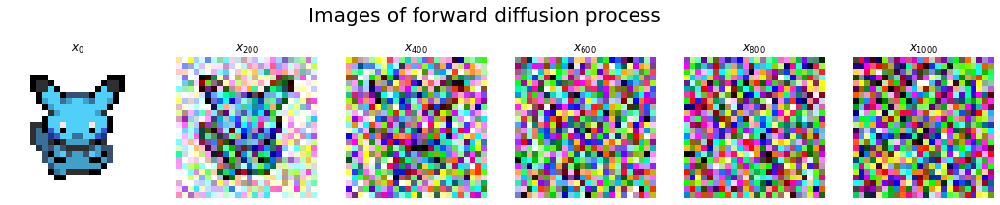

In [45]:
#| code-fold: true
#| code-summary: ""
xs, epsilons = forward_t_steps(tfm(samp1), 1000, betas_t, True)
show_images(xs[::200], 1, 6, titles=title_lists[0], suptitle=suptitles[0])

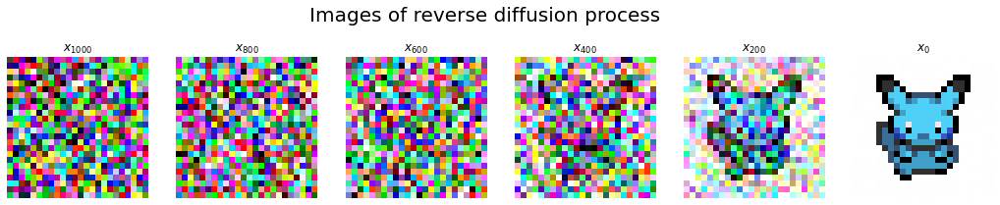

In [46]:
#| code-fold: true
#| code-summary: ""
denoised_xs = reverse_t_steps(xs[-1], 1000, betas_t, epsilons, True)
show_images(denoised_xs[::200], 1, 6, titles=title_lists[1], suptitle=suptitles[1])

# Diffusion Model

## Neural network model

As mentioned above, the noise $\epsilon$ is approximately predicted by the neural network. One advantage of the diffusion model is that it has a freedom to choose any neural network architecture as long as its output $\epsilon$ is of the same size as its input $x$.

With the architecture freedom, the typical choice is the U-net architecture because the skip-connection from the downsampling path (data encoder) to the upsampling path (data decoder) is proven to work well on a similar task.

![Unet architecture (Source: [ZSL](https://zslpublications.onlinelibrary.wiley.com/doi/10.1002/rse2.111))](unet.png){fig-alt="Unet neural network architecture"}

## Noise scheduler

The noise scheduler is defined with the parameters of the diffusion process. It is used to generate a corrupted  data sample $x_t$ from its clean version $x_0$ for NN model training, and to generate a data sample $x_0$ from noise $\epsilon$ by applying the reverse-diffusion (denoise) process with the trained NN model.

- $T$: the maximum number of steps of the diffusion process 
- $\beta_t$: The strength of a noise $\epsilon$ added in each diffusion step
- ($\alpha_t$ can be usually derived from $\beta_t$)

As long as $\alpha_t < 1$ is satisfied, the diffusion process will transform the data $x$ to the normally distributed noise $\epsilon$. However, it usually has the following properties to make it easier for a neural network to predict the noise of a single diffusion step.

1. $\alpha_t$ is a decreasing series from ~1 to ~0
2. $\prod_{i=1}^{t}\alpha_i = \alpha_1 \times \alpha_2 \times \cdots \times \alpha_t = \bar{\alpha}_t$ shows a linear drop around $t \approx \frac{T}{2}$ and an almost flat line with a very little decrease around $t \approx 0$ and $t \approx T$

<details>
    <summary>Details (Noise scheduler)</summary>
To be precise, noise scheduler is defined with the transformation of foward/reverse diffusion steps. With the defined diffusion process and given parameters, it should be able to transform data to a noise and denoise the noise back to data.
</details>

In [ ]:
#| code-fold: true
#| code-summary: Code (U-net)

class UnetModel(nn.Module):
    """U-net model"""
    
    def __init__(self, in_channels, out_channels, block_out_channels, max_timestep, 
                 norm_groups=None, norm_eps=1e-6, 
                 block_num_layers=2, temb_channels=None, 
                 emb_type='shift', act_fn=nn.ReLU(), num_classes=None):
        """
        Args:
            in_channels: Number of input channels
            out_channels: Number of output channels
            block_out_channels: Number of output channels of each UnetDownBlock
            max_timestep: Maximum timestep (NoiseScheduler.max_t)
            norm_groups: Number of channel groups used in GroupNorm
            norm_eps: Value for stability in GroupNorm
            block_num_layers: Number of Residual blocks to be used in downsampling
                              (block_num_layers + 1 Residual blocks in upsampling)
            temb_channels: Number of timestep embedding channels
                           If None, default to 4 *  block_out_channels[0]
            emb_type: 'shift': additive, 'scale_shift': additive + multiplicative
                If 'shift', h -> h + emb
                If 'scale_shift', h -> h * (1 + emb[:n/2]) + emb[n/2:]
            act_fn: Activation function to be used
            num_classes: If not None, number of possible conditions
        """
        super().__init__()

        if not temb_channels: # Timestep embedding channels
            temb_channels = 4 * block_out_channels[0]
        if not norm_groups:
            norm_groups = block_out_channels[0] // 4
        if len(block_out_channels) > 0:
            block_out_channels += [block_out_channels[-1]]

        # Class condition embedding
        cemb_channels = 0
        self.cemb_module = None
        if num_classes is not None:
            cemb_channels = temb_channels//4
            self.cemb_module = nn.Embedding(num_classes, cemb_channels)

        # Timestep embedding module
        self.temb_module = \
            TimestepEmbedding(temb_channels//2, temb_channels, 
                              act_fn=act_fn, max_timestep=max_timestep)

        # First convolution
        self.conv_in = nn.Sequential(
            nn.Conv2d(in_channels, block_out_channels[0], 3, stride=1, padding=1)
        )
        
        # Downsample and Upsample blocks
        self.down_blocks = nn.ModuleList()
        self.up_blocks = nn.ModuleList()

        # Last convolution
        self.conv_out = nn.Sequential(
            nn.GroupNorm(norm_groups, block_out_channels[0], norm_eps, affine=True),
            act_fn,
            nn.Conv2d(block_out_channels[0], out_channels, 3, stride=1, padding=1)
        )

        # Downsample blocks
        out_channels = block_out_channels[0]
        for i in range(len(block_out_channels)):
            downsample = False if i == len(block_out_channels) - 1 else True
            
            in_channels = out_channels
            out_channels = block_out_channels[i]

            self.down_blocks.append(
                UnetDownBlock(
                    in_channels,
                    out_channels,
                    temb_channels + cemb_channels,
                    norm_groups,
                    norm_eps,
                    num_layers=block_num_layers,
                    emb_type=emb_type,
                    act_fn=act_fn,
                    downsample=downsample
                )
            )

        # Upsample blocks
        reversed_block_out_channels = list(reversed(block_out_channels))
        out_channels = reversed_block_out_channels[0]
        for i in range(len(reversed_block_out_channels)):
            upsample = False if i == len(reversed_block_out_channels) - 1 else True
            
            in_channels = out_channels
            out_channels = reversed_block_out_channels[i]
            down_channel_idx = min(i + 1, len(reversed_block_out_channels) - 1)
            down_block_in_channels = reversed_block_out_channels[down_channel_idx]

            self.up_blocks.append(
                UnetUpBlock(
                    in_channels,
                    out_channels,
                    down_block_in_channels,
                    temb_channels + cemb_channels,
                    norm_groups,
                    norm_eps,
                    num_layers=block_num_layers + 1,
                    emb_type=emb_type,
                    act_fn=act_fn,
                    upsample=upsample
                )
            )

    def forward(self, x, t, c=None):
        """
        Args:
            x: Input data
            t: Input timestep
            c: Optional condition (class) input
        """
        # Create an embedding of timestep (+ class)
        emb = self.temb_module(t)
        if self.cemb_module is not None:
            cemb = self.cemb_module(c)
            emb = torch.cat((emb, cemb), dim=1)

        # Input convolution
        h = self.conv_in(x)

        # Downsampling path
        h_all_states = (h, )
        for down_block in self.down_blocks:
            h, h_states = down_block(h, emb)

            h_all_states += h_states
            
        # Upsampling path
        for up_block in self.up_blocks:
            # Skip-connections
            skip_h_states = h_all_states[-up_block.num_layers:]
            h_all_states = h_all_states[:-up_block.num_layers]

            h = up_block(h, skip_h_states, emb)

        out = self.conv_out(h)

        return out

    
class TimestepEmbedding(nn.Module):
    """Timestep embedding module"""
    
    def __init__(self, hidden_dim, embedding_dim, act_fn, 
                 max_timestep=1e3, scale=math.pi/2):
        """
        Args:
            hidden_dim: Dimension of intermediate hidden layer
            embedding_dim: Embedding dimension
            act_fn: Activation function to be used
            max_timestep: Maximum timestep (NoiseScheduler.max_t)
        """
        super().__init__()
        
        self.h_dim = hidden_dim #embedding_dim // 4
        self.emb_dim = embedding_dim
        self.max_t = max_timestep
        self.scale = scale
        
        self.layers = nn.Sequential(*[
            nn.Linear(self.h_dim, self.emb_dim),
            act_fn,
            nn.Linear(self.emb_dim, self.emb_dim)
        ])

    def forward(self, timesteps):
        """
        Args:
            timesteps: Batch of timesteps
            
        Returns:
            Batch of timestep embeddings
        """
        # Create const-like, linear-like and random-like embeddings
        half_h_dim = self.h_dim // 2
        exponent = -math.log(10 * self.max_t) / half_h_dim * \
            torch.arange(0, half_h_dim, device=timesteps.device)
        emb = torch.exp(exponent) * self.scale
        emb = timesteps[:, None].float() * emb[None, :]

        emb = torch.cat([torch.cos(emb), torch.sin(emb)], dim=-1)
        
        temb = self.layers(emb)
        
        return temb

    
class UnetDownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, emb_channels, norm_groups,
                 norm_eps=1e-6, num_layers=2, emb_type='shift', 
                 act_fn=nn.ReLU(), downsample=True, output_scale=1.0):
        """
        Args:
            in_channels: Number of input channels
            out_channels: Number of output channels
            emb_channels: Number of embedding channels
                          (timestep or timestep + condition embedding)
            norm_groups: Number of channel groups used in GroupNorm
            norm_eps: Value for stability in GroupNorm
            num_layers: Number of Residual blocks to be used
            emb_type: 'shift': additive, 'scale_shift': additive + multiplicative
                If 'shift', h -> h + emb
                If 'scale_shift', h -> h * (1 + emb[:n/2]) + emb[n/2:]
            act_fn: Activation function to be used
            downsample: whether or not to apply downsampling 
        """
        super().__init__()

        self.res_blocks = nn.ModuleList()
        self.downsample_blocks = nn.ModuleList()

        # Residual blocks
        for i in range(num_layers):
            in_ch = in_channels
            out_ch = in_channels

            self.res_blocks.append(
                ResBlock(in_ch, out_ch, emb_channels, norm_groups, norm_eps, 
                         emb_type, act_fn, init_zero=True, 
                         output_scale=output_scale)
            )
        
        # Downsampling modules
        if downsample:
            self.downsample_blocks.append(
                DownSample2D(in_channels, out_channels, 
                             norm_groups, norm_eps, act_fn, output_scale)
            )

    def forward(self, x, emb):
        # Gather hidden states for skip-connections
        h_states = ()

        h = x
        for block in self.res_blocks:
            h = block(h, emb)
            h_states += (h, )
        
        for block in self.downsample_blocks:
            h = block(h)
            h_states += (h, )

        return h, h_states


class UnetUpBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down_in_channels, emb_channels, 
                 norm_groups, norm_eps=1e-6, num_layers=3, emb_type='shift', 
                 act_fn=nn.ReLU(), upsample=True, output_scale=1.0):
        """
        Args:
            in_channels: Number of input channels
            out_channels: Number of output channels
            down_in_channels: Number of skip-connection channels
            emb_channels: Number of embedding channels
                          (timestep or timestep + condition embedding)
            norm_groups: Number of channel groups used in GroupNorm
            norm_eps: Value for stability in GroupNorm
            num_layers: Number of Residual blocks to be used
            emb_type: 'shift': additive, 'scale_shift': additive + multiplicative
                If 'shift', h -> h + emb
                If 'scale_shift', h -> h * (1 + emb[:n/2]) + emb[n/2:]
            act_fn: Activation function to be used
            upsample: whether or not to apply downsampling 
        """
        super().__init__()
        
        self.num_layers = num_layers

        self.res_blocks = nn.ModuleList()
        self.upsample_blocks = nn.ModuleList()
        
        # Residual blocks
        for i in range(num_layers):
            skip_channels = down_in_channels
            in_ch = (out_channels) + skip_channels
            out_ch = out_channels 
            
            self.res_blocks.append(
                ResBlock(in_ch, out_ch, emb_channels, norm_groups, norm_eps, 
                         emb_type, act_fn, output_scale=output_scale)
            )
        
        # Upsampling modules
        if upsample:
            self.upsample_blocks.append(Upsample2D(out_ch, down_in_channels))


    def forward(self, x, skip_states, emb):
        h = x
        for block in self.res_blocks:
            # skip connection from the downsampling path of Unet
            skip_h = skip_states[-1]
            skip_states = skip_states[:-1]
            h = torch.cat((h, skip_h), dim=1)

            h = block(h, emb)

        for block in self.upsample_blocks:
            h = block(h)
        
        return h

    
class DownSample2D(nn.Module):
    """2D downsampling module with residual-like layers"""
    
    def __init__(self, in_channels, out_channels, norm_groups,
                 norm_eps=1e-6, act_fn=nn.ReLU(), output_scale=1.0):
        """
        Args:
            in_channels: Number of input channels
            out_channels: Number of output channels
            norm_groups: Number of channel groups used in GroupNorm
            norm_eps: Value for stability in GroupNorm
            act_fn: Activation function to be used
        """
        super().__init__()
        
        self.output_scale = output_scale
        self.act_fn = act_fn

        # 1st path of 3x3 convolutions
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 
                               stride=2, padding=1, bias=False)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 
                               stride=1, padding=1, bias=False)
        
        # 2nd path of polling and 1x1 convolution
        self.pool  = nn.AvgPool2d(2, 2)
        self.conv3 = nn.Conv2d(in_channels, out_channels, 1, 1, bias=False)
        
        self.norm1 = nn.GroupNorm(norm_groups, in_channels, norm_eps, affine=True)
        self.norm2 = nn.GroupNorm(norm_groups, out_channels, norm_eps, affine=True)
        
        # Init residual path to zero
        nn.init.zeros_(self.conv2.weight)
        
    def forward(self, x):
        x = self.act_fn(self.norm1(x))
        
        # 1st path
        h1 = self.conv1(x)
        h1 = self.act_fn(self.norm2(h1))
        h1 = self.conv2(h1)
        
        # 2nd path
        h2 = self.conv3(self.pool(x))
        
        return (h1 + h2) / self.output_scale


class Upsample2D(nn.Module):
    """2D upsampling module"""
    
    def __init__(self, in_channels, out_channels, 
                 scale=2.0, interpolate_mode='bilinear'):
        """
        Args:
            in_channels: Number of input channels
            out_channels: Number of output channels
            scale: Upsampling ratio
            interpolation_mode: Upsampling interpolation mode
        """
        super().__init__()
        
        self.scale = scale
        self.interpolate_mode = interpolate_mode
        self.conv = nn.Conv2d(in_channels, out_channels, 3, padding=1)

    def forward(self, x):
        h = F.interpolate(x, scale_factor=self.scale, mode=self.interpolate_mode)
        h = self.conv(h)
        return h

    
class ResBlock(nn.Module):
    """Residual block"""
    
    def __init__(self, in_channels, out_channels, emb_channels, norm_groups, 
                 norm_eps=1e-6, emb_type='shift', act_fn=nn.ReLU(),
                 skip_time_act=False, init_zero=False, output_scale=1.0):
        """
        Args:
            in_channels: Number of input channels
            out_channels: Number of output channels
            emb_channels: Number of embedding channels
                          (timestep or timestep + condition embedding)
            norm_groups: Number of channel groups used in GroupNorm
            norm_eps: Value for stability in GroupNorm
            emb_type: 'shift': additive, 'scale_shift': additive + multiplicative
                If 'shift', h -> h + emb
                If 'scale_shift', h -> h * (1 + emb[:n/2]) + emb[n/2:]
            act_fn: Activation function to be used
            skip_time_act: whether or not to skip pre-activation of input embedding
            init_zero: whether or not to init last module of conv path to zero
        """
        super().__init__()

        self.emb_type = emb_type
        self.act_fn = act_fn
        self.skip_time_act = skip_time_act
        self.output_scale = output_scale

        # Convolution path
        self.norm1 = nn.GroupNorm(norm_groups, in_channels, norm_eps, affine=True)
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, 
                               stride=1, padding=1, bias=False)
        self.norm2 = nn.GroupNorm(norm_groups, out_channels, norm_eps, affine=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, 
                               stride=1, padding=1, bias=False)

        if emb_type == 'scale_shift':
            self.emb_proj = nn.Linear(emb_channels, 2*out_channels)
        else:
            self.emb_proj = nn.Linear(emb_channels, out_channels)
            
        # Residual path
        self.conv3 = nn.Identity()
        if in_channels != out_channels:
            self.conv3 = nn.Conv2d(in_channels, out_channels, 1, 
                                   stride=1, padding=0, bias=True)
            
        if init_zero:
            nn.init.zeros_(self.conv2.weight)

    def forward(self, x, emb):
        # Process input embedding into offset (or scale + offset)
        if self.emb_type is not None:
            if not self.skip_time_act:
                emb = self.act_fn(emb)
            emb = self.emb_proj(emb)[:, :, None, None] # unsqueeze over H x W

            scale = 0
            offset = emb
            if self.emb_type == 'scale_shift':
                scale, offset = torch.chunk(emb, 2, dim=1)

        # Convolution path
        h = self.act_fn(self.norm1(x))
        h = self.conv1(h)

        h = h * (1 + scale) + offset

        h = self.act_fn(self.norm2(h))
        h = self.conv2(h)

        return (self.conv3(x) + h) / self.output_scale

In [6]:
#| code-fold: true
#| code-summary: Code (Noise scheduler)

class NoiseScheduler:
    """Implementation of forward and reverse diffusion processes
    
    Parameters:
        max_t: maximum possible timestep T
        betas: A series of stdev of normally distributed noises
        ts: A series of increasing integers 1 ~ T
    
    Methods:
        add_noise: Apply the forward diffusion step t times
        denoise: Apply a single reverse diffusion step
    """
    def __init__(self, max_t, betas):
        self.max_t = max_t
        self.betas = betas
        self.ts = list(range(1, max_t + 1))
        
    def _process(self, step_func, iterable):
        processed_xb = []
        for step_func_args in iterable:
            x_t = step_func(*step_func_args)
            processed_xb.append(x_t)
        processed_xb = torch.stack(processed_xb)
        
        return processed_xb
    
    def to(self, device):
        self.betas = self.betas.to(device)
        return self
    
    def add_noise(self, xb, tb, noiseb):
        """Apply the forward diffusion step `tb` times to `xb` with `noiseb`
        
        Args:
            xb: Batch of data x
            tb: Batch of timesteps t
            noiseb: Batch of noises that will be added to `xb`
        
        Returns:
            Batch of diffused data
        """
        if isinstance(xb, np.ndarray):
            xb = batch_tfm(xb)
            
        if noiseb is None:
            betasb = (self.betas[:t] for t in tb)
            diffused_xb = self._process(forward_t_steps, 
                                        zip(xb, betasb))
        else:
            diffused_xb = self._process(forward_step, 
                                        zip(xb, self.betas[tb-1], noiseb))
        return diffused_xb
    
    def denoise(self, xb, t, noiseb):
        """Apply a single reverse diffusion step to `xb` with `noiseb` at `t`
        
        Args:
            xb: Batch of diffused data x
            t: Current timestep of `xb`. This controls the amount of noise to remove.
            noiseb: Batch of noises to eliminate from `xb`
        
        Returns:
            Batch of data denoised by a single reverse step
        """
        if isinstance(xb, np.ndarray):
            xb = batch_tfm(xb)
        iterable = zip(xb, self.betas[[t-1] * len(xb)], noiseb)
        denoised_xb = self._process(reverse_step, iterable)
        return denoised_xb

In [23]:
#| code-fold: true
#| code-summary: Code (Diffusion  model)

class DiffusionModelBase:
    """Diffusion model that can train a noise predictor and generate data
    
    Parameters:
        noise_scheduler (NoiseScheduler): Diffusion process implementation
        noise_predictor (torch.nn.Module): Noise predicting model
        optim (torch.optim.Optimizer): Optimiser of `noise_predictor` 
    
    Methods:
        train: Train `noise_predictor` with diffused data samples
        generate: Generate denoised clean data from normally distributed noise
    """
    def __init__(self, nn_model, noise_scheduler, optimizer=None, device='cuda'):
        self.device = device
        self.noise_predictor = nn_model.to(device)
        self.noise_scheduler = noise_scheduler.to(device)
        if optimizer is None:
            self.optim = torch.optim.Adam(self.noise_predictor.parameters(), lr=1e-3)
        else:
            self.optim = optimizer
            
        
    def _diffuse_data(self, xb, tb, noiseb):
        # Add `noiseb` to (`tb` - 1)th diffused data 
        diffused_xb_pre = self.noise_scheduler.add_noise(xb, tb - 1, None)
        diffused_xb = self.noise_scheduler.add_noise(diffused_xb_pre, tb, noiseb)
        return diffused_xb
    
    def _predict_noise(self, xb, tb, cb):
        return self.noise_predictor(xb, tb)
    
    def train(self, dataloader, n_epoch=5):
        """Train `noise_preditor` on `dataloader`
        
        Args:
            dataloader (torch.utils.data.DataLoader): Iterable training data
            n_epoch: Number of epochs to train `noise_predictor`
        """
        max_t = self.noise_scheduler.max_t
        base_lr = self.optim.param_groups[0]['lr']
        losses = []

        self.noise_predictor.train()
#         step = 0

        for ep in range(n_epoch):
            # Exponential decay learning rate per epoch
            self.optim.param_groups[0]['lr'] = base_lr/(2**ep)

            extra_info = {'epoch': ep}
            dl = pbar(dataloader, extra_info, min_interval=2)
            for xb, yb in dl:   # x: images, y: labels
#                 self.optim.param_groups[0]['lr'] = base_lr * lr_lambda(step)
#                 step += 1
                self.optim.zero_grad()
                xb = xb.to(self.device)

                # Perturb data
                noiseb = torch.randn_like(xb)
                tb = torch.randint(1, max_t + 1, (xb.shape[0],)).to(self.device)
                
                diffused_xb = self._diffuse_data(xb, tb, noiseb)

                # Use neural network to predict noise
                pred_noiseb = self._predict_noise(diffused_xb, tb, yb)

                # Loss between the predicted and true noise
                loss = F.mse_loss(pred_noiseb, noiseb)
                loss.backward()
                self.optim.step()
                
                # Show learning-rate and 100-step mean of loss with a progress bar
                losses.append(loss.item())
                extra_info['loss'] = np.mean(losses[-100:]).round(4)
                extra_info['lr'] = self.optim.param_groups[0]['lr']

    @torch.no_grad()
    def generate(self, n_sample, n_ch, sz, 
                 cb=None, seed=None, return_intermediates=False):
        """Generate data (`n_sample` x `n_ch` x `sz` x `sz`)
        
        Args:
            n_sample: Number of data samples to generate
            n_ch: Number of channel
            sz: Height and width
            cb: Optional batch of condition c
                (It requires `noise_predictor` to be a conditional model)
            seed: Optional random seed
            return_intermediates (bool):
                if `True`, return all intermediate data during generation process
                if `False, return the final generated data
            
        Returns:
            (final generated data, (intermediate timesteps, intermediate data)) OR
            final generated data
        """
        max_t = self.noise_scheduler.max_t
        samples = torch.randn(n_sample, n_ch, sz, sz, generator=seed)
        samples = samples.to(self.device)
        intermediate_imgs = [samples.detach().cpu()]
        intermediate_ts = [max_t]
        
        self.noise_predictor.eval()
        
        extra_info = {}
        reversed_ts = self.noise_scheduler.ts[::-1]
        progress = pbar(reversed_ts, extra_info)
        for i, t in enumerate(progress):
            tb = torch.tensor([t]*n_sample).to(self.device)

            # Use the trained noise_predictor to predict noise
            pred_noiseb = self._predict_noise(samples, tb, cb)
            
            # Apply a reverse diffusion step (denoise step)
            samples = self.noise_scheduler.denoise(samples, t, pred_noiseb)
            
            # Sample intermiedate data with rate of (max_t // 100)
            if return_intermediates:
                if i % (max_t // 100) == 0 or t < 5:
                    intermediate_imgs.append(samples.detach().cpu())
                    intermediate_ts.append(t)

        intermediates = (intermediate_ts, torch.stack(intermediate_imgs))
        return (samples, intermediates) if return_intermediates else samples

    
# def lr_lambda(current_step):
#     num_warmup_steps = 350
#     num_training_steps = 3744
#     num_cycles = 0.5
#     if current_step < num_warmup_steps:
#         return float(current_step) / float(max(1, num_warmup_steps))
#     progress = float(current_step - num_warmup_steps) / float(max(1, num_training_steps - num_warmup_steps))
#     return max(0.0, 0.5 * (1.0 + math.cos(math.pi * float(num_cycles) * 2.0 * progress)))

# Diffusion Model examples: DDPM and DDIM

**DDPM (Denoising Diffusion Probabilistic Model)** [@ho2020denoising] is structured as follows:

- Neural network model
    - U-net architecture
        - Convolution layers with group normalisation
        - Sinusoidal positional embedding for the timestep $t$
        - Self-attention layers at low-resolution hidden states
- Noise scheduler
    - T = 1000
    - $\beta_t^2$ = Uniform linear samples between $\beta_1^2 = 0.0001$ and $\beta_T^2 = 0.02$
    
    
**DDIM (Denoising Diffusion Implicit Model)** [@song2022denoising] changes the forward/reverse diffusion process formula of DDPM such that the the strength of noise can be further controlled by another parameter $\eta$. By controlling the randomness of each diffusion step, it can make the data generation process more deterministic. DDIM also showed that it can generate higher quality samples with fewer number of steps than DDPM with the same noise scheduler configuration.

- Neural network model
    - U-net architecture
        - Wide Residual Network based backbone
- Noise scheduler
    - Same as DDPM

<details>
    <summary>Details (DDPM and DDIM mathematical formulations)</summary>

In detail, DDPM chooses a Gaussian diffusion kernel with its kernel variances $\beta_t^2$ fixed to constants. It uses the following forward-process formula to generate $x_t$ with $x_0$.

$$
\begin{aligned}
x_t &= \alpha_t x_{t-1} + \beta_t \epsilon_{t} \ \ \ \ \ \ \ \ \ \ (\alpha_t = \sqrt{1 - \beta_t^2}, \ \epsilon_t \sim \mathcal{N}(0, I)) \\
    &= \alpha_t \alpha_{t-1} x_{t-2} + \alpha_t \sqrt{1 - \alpha_{t-1}^2} \epsilon_{t-1} + \sqrt{1 - \alpha_t^2} \epsilon_t \\
    &= \ \ ... \\
    &= \alpha_t \ ... \ \alpha_1 x_0 + [ (\alpha_t ... \alpha_2) \sqrt{1 - \alpha_1^2} \epsilon_1 + \ ... \ +  \sqrt{1 - \alpha_t^2} \epsilon_t] \\
    &= \bar{\alpha}_t x_0 + \sqrt{1 - \bar{\alpha}_t^2} \bar{\epsilon}_t \ \ \ \ \ \ \ \ \ \ \because \sigma_1 \epsilon_1 + \sigma_2 \epsilon_2 \sim \mathcal{N} (0, (\sigma_1^2 + \sigma_2^2)I) \\
\therefore \ q(x_t|x_0) &= \mathcal{N}(x_t; \ \bar{\alpha}_t x_0, \sqrt{1 - \bar{\alpha}_t^2} I)
\end{aligned} 
$$

Based on this, the neural network model $p_\theta$ can be trained to minimise its negative data log likelihood (expectation under $q$).

$$
\begin{aligned}
Objective &= - \mathbb{E}_{q(x_0)} \ log \ p_\theta(x_0) \\
    &= - \mathbb{E}_{q(x_0)} \ log \ (\int \frac{q(x_{1:T}|x_0)}{q(x_{1:T}|x_0)} p_\theta(x_{0:T}) \ d x_{1:T}) \\
    &\leq - \mathbb{E}_{q(x_{0:T})} \ log \frac{p_\theta(x_{0:T})}{q(x_{1:T}|x_0)} \ \ \ \ \ \because Jensen's \ inequality \\
    &= - \mathbb{E}_q \ log \ \frac{p(x_T) \ p_\theta(x_{0:T-1} | x_T)}{q(x_{1:T}|x_0)} \\
    &= \mathbb{E}_q \ [ -log \ p(x_T) - \Sigma_{t=2}^T \ log \ \frac{p_\theta(x_{t-1}|x_t)}{q(x_t|x_{t-1})} - log \ \frac{p_\theta(x_0|x_1)}{q(x_1|x_0)} \ ] \\
    &= \mathbb{E}_q \ [ -log \ p(x_T) - \Sigma_{t=2}^T \ log \ \frac{p_\theta(x_{t-1}|x_t)}{q(x_{t-1}|x_t, x_0)} \cdot  \frac{q(x_{t-1}|x_0)}{q(x_t|x_0)} - log \ \frac{p_\theta(x_0|x_1)}{q(x_1|x_0)} \ ] \ \ \ \ \ \because q(x_t|x_{t-1}) = q(x_t|x_{t-1}, x_0) \\
    &= \mathbb{E}_q \ [ -log \frac{p(x_T)}{q(x_T|x_0)} - \Sigma_{t=2}^T \ log \frac{p_\theta(x_{t-1}|x_t)}{q(x_{t-1}|x_t, x_0)} - log \ p_\theta(x_0 | x_1) \ ]
\end{aligned}
$$

In the final equation, the first term doesn't depend on $\theta$ and the third term can be ignored as the step size from $x_1$ to $x_0$ is small. Then, the whole objective can be optimised by minimising the second term. As it can be seen as KL-divergence, training $p_\theta(x_{t-1}|x_t) \simeq q(x_{t-1}|x_t, x_0)$ will maximise the model's data likelihood.



$$
\begin{aligned}
q(x_{t-1} | x_t, x_0) &= q(x_t | x_{t-1}, x_0) \frac{q(x_{t-1} | x_0)}{q(x_t | x_0)} \ \ \ \ \ \ \ \ \ \ \because Bayes' \ theorem \\
    &= \frac{1}{Z} exp[-\frac{1}{2} (\frac{(x_t - \alpha_t x_{t-1})^2}{\beta_t^2}) + \frac{(x_{t-1} - \bar{\alpha}_{t-1} x_0)^2}{1 - \bar{\alpha}_{t-1}^2} - \frac{(x_t - \bar{\alpha}_t x_0)^2}{1 - \bar{\alpha}_t^2}] \\
    &= \frac{1}{Z} exp[-\frac{1}{2} \frac{(x_{t-1} - \tilde{\mu}_t)^2}{\tilde{\beta}_t^2}]  
\\
\tilde{\mu}_t &= \frac{\alpha_t (1 - \bar{\alpha}_{t-1}^2)}{1 - \bar{\alpha}_{t}^2} x_t + \frac{\bar{\alpha}_{t-1} \beta_t^2}{1 - \bar{\alpha}_t^2} x_0 \\
    &= \frac{\alpha_t (1 - \bar{\alpha}_{t-1}^2)}{1 - \bar{\alpha}_{t}^2} x_t + \frac{\bar{\alpha}_{t-1} \beta_t^2}{1 - \bar{\alpha}_t^2} \ \frac{1}{\bar{\alpha}_t} (x_t - \sqrt{1 - \bar{\alpha}_t^2} \bar{\epsilon}_t) \\
\tilde{\beta}_t^2 &= \frac{1 - \bar{\alpha}_{t-1}^2}{1 - \bar{\alpha}_t^2} \beta_t^2 
\\
\\
x_{t-1} &= \tilde{\mu}_t + \tilde{\beta}_t \epsilon  \ \ \ \ \ (\epsilon \sim \mathcal{N}(0, I)) \\
    &= \frac{1}{\alpha_t} (x_t - \frac{1 - \alpha_t^2}{\sqrt{1 - \bar{\alpha}_t^2}} \bar{\epsilon}_t) \ + \tilde{\beta}_t \epsilon \ \ \ \ \ \because x_0 = \frac{1}{\bar{\alpha}_t} (x_t - \sqrt{1-\bar{\alpha}_t^2} \bar{\epsilon}_t)
\end{aligned}
$$

As $\epsilon$ is a random variable and its variance is fixed to a constant $\tilde{\beta}$, $p_\theta(x_{t-1}|x_t)$ can model $q(x_{t-1}|x_t, x_0)$ by training a neural network to predict $\bar{\epsilon}_t$ given $x_t$.

DDIM is a slight variation with a tunable variance of $\epsilon$ with $\eta$, where it becomes deterministic when $\eta = 0$:

$$
\begin{aligned}
x_{t-1} &= \frac{\alpha_t (1 - \bar{\alpha}_{t-1}^2)}{1 - \bar{\alpha}_{t}^2} x_t + \frac{\bar{\alpha}_{t-1} \beta_t^2}{1 - \bar{\alpha}_t^2} x_0 + \tilde{\beta}_t \epsilon \\
    &= \bar{\alpha}_{t-1} x_0  + \sqrt{1 - \bar{\alpha}_{t-1}^2 - \tilde{\beta}_t^2} \ \frac{(x_t - \bar{\alpha}_t x_0)}{\sqrt{1 - \bar{\alpha}_t^2}} + \tilde{\beta}_t \epsilon \\
    &\simeq \bar{\alpha}_{t-1} x_0  + \sqrt{1 - \bar{\alpha}_{t-1}^2 - \eta \tilde{\beta}_t^2} \ \bar{\epsilon}_t + \sqrt{\eta} \tilde{\beta}_t \epsilon \ \ \ \ \ \because \sigma_1 \epsilon_1 + \sigma_2 \epsilon_2 \sim \mathcal{N} (0, (\sigma_1^2 + \sigma_2^2)I) \\
\end{aligned}
$$
   
</details>

In [21]:
#| code-fold: true
#| code-summary: Code (DDPM/DDIM noise scheduler)

class EtaTunedScheduler(NoiseScheduler):
    """Implementation of DDPM/DDIM
    
    Parameters:
        eta: Parameter to control randomness of diffusion process
             (DDPM: eta = 1, deterministic DDIM: eta = 0)
        max_t: maximum possible timestep T
        betas_sqr: A series of variance of normally distributed noises
        ts: A series of increasing integers 1 ~ T
    
    Methods:
        add_noise: Apply the forward diffusion step t times
        denoise: Apply a single reverse diffusion step
    """
    def __init__(self, max_t, betas, eta):
        self.eta = eta
        
        self.max_t = max_t
        self.betas_sqr = betas ** 2
        self.ts = list(range(1, max_t + 1))
        
        alphas_sqr = 1 - self.betas_sqr
        self.a_sqr_bar = torch.cumsum(alphas_sqr.log(), dim=0).exp()
        
    def _prev_t(self, t):
        return t - 1
        
    def to(self, device):
        self.betas_sqr = self.betas_sqr.to(device)
        self.a_sqr_bar = self.a_sqr_bar.to(device)
        return self
    
    def add_noise(self, xb, tb, noiseb):
        # Efficient implementation of NoiseScheduler.add_noise
        if isinstance(xb, np.ndarray):
            xb = batch_tfm(xb)
            
        a_sqr_bar = self.a_sqr_bar[tb - 1, None, None, None]
        diffused_xb = a_sqr_bar.sqrt() * xb + (1 - a_sqr_bar).sqrt() * noiseb
        
        return diffused_xb
    
    def denoise(self, xb, t, noiseb):
        if isinstance(xb, np.ndarray):
            xb = batch_tfm(xb)
            
        z = torch.randn_like(xb) if t > 1 else 0
        
        # Parameters of alpha and beta
        cur_t = t - 1
        pre_t = self._prev_t(cur_t)
        b_sqr = self.betas_sqr[cur_t]
        a_sqr_bar = self.a_sqr_bar[cur_t]
        prev_a_sqr_bar = self.a_sqr_bar[pre_t] if pre_t >= 0 else torch.tensor(1.)
    
        # Eta-controlled variance of randomness
        var = b_sqr * (1 - prev_a_sqr_bar) / (1 - a_sqr_bar)
        scaled_var = self.eta * var

        x0_hat = (xb - noiseb * (1 - a_sqr_bar).sqrt()) / a_sqr_bar.sqrt()
        
        noise_coeff = (1 - prev_a_sqr_bar - scaled_var).sqrt()
        mean = prev_a_sqr_bar.sqrt() * x0_hat + noise_coeff * noiseb
        denoised_xb = mean + scaled_var.sqrt() * z

        return denoised_xb
    
# NUM_TIMESTEPS = 1000
# DDPMScheduler = EtaTunedScheduler(NUM_TIMESTEPS, betas_t, eta=1.0)
# DDIMScheduler = EtaTunedScheduler(NUM_TIMESTEPS, betas_t, eta=0.0)

In [ ]:
#| code-fold: true
#| code-summary: Code (DDPM/DDIM model)

class DiffusionModel(DiffusionModelBase):
    
    def _diffuse_data(self, xb, tb, noiseb):
        # Add `noiseb` to `xb`
        diffused_xb = self.noise_scheduler.add_noise(xb, tb, noiseb)
        return diffused_xb
    
    
# Diffusion model training on FMNIST dataset
NUM_TIMESTEPS = 1000
BETAS_SQR_1   = 1e-4
BETAS_SQR_T   = 2e-2
BATCH_SIZE    = 128

betas = torch.linspace(BETAS_SQR_1, BETAS_SQR_T, NUM_TIMESTEPS).sqrt()


dataset = FMNISTDataset()
dataloader = DataLoader(dataset, BATCH_SIZE, shuffle=True)

# Neural network model to predict noise  
nn_model = UnetModel(
    in_channels=1,
    out_channels=1,
    block_num_layers=2,
    block_out_channels=[32, 64, 128],
    max_timestep=NUM_TIMESTEPS,
    norm_groups=8
)


DDPMScheduler = EtaTunedScheduler(NUM_TIMESTEPS, betas, eta=1.0)
DDPMModel = DiffusionModel(nn_model, DDPMScheduler)
# DDIMScheduler = EtaTunedScheduler(NUM_TIMESTEPS, betas, eta=0.0)
# DDIMModel = DiffusionModel(nn_model, DDIMScheduler)

DDPMModel.train(dataloader, 5)

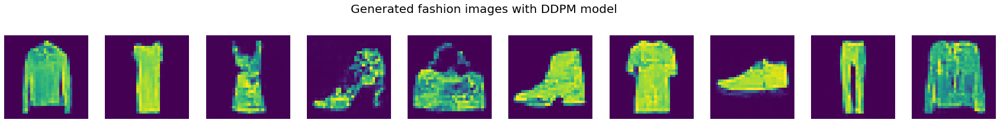

In [44]:
#| code-fold: true
#| code-summary: ""
n_samples = 10
generated_imgs = DDPMModel.generate(n_samples, n_ch=1, sz=32)
show_images(generated_imgs, 1, 10, suptitle=suptitles[2])

# Conditional generation
## Conditional model and Guidance technique


![](models.png){fig-alt="Unconditional vs Conditional model" fig-align="center"}

If there is a mechanism to control the generated data, it will be more useful. One typical method in deep learning is to add additional input data $c$ such that the model generates data relevant to the information $c$ from a random noise $z$.

Another common method in a diffusion model is called **Guidance**. The reverse diffusion step can be viewed as a denoising step: Given a noise-like data $x_t$, find out less noise-like one $x_{t-1}$ by predicting the added noise $\epsilon_t$ and eliminating it from $x_t$. Guidance changes the noise prediction $\epsilon$ with the condition information $c$ such that $x_{t-1}$ is closer to the data $x$ relevant to $c$ out of all other possible $x$. Parameter called **Guidance scale** determines the strength towards the controlled generation.

![](guidance.png){fig-alt="Guidance technique" fig-align="center"}

There are 2 kinds of guidance tecniques:

- **Classifier-based guidance**: It uses a seperately trained classifier model that can predict $p(c|x)$. As it's trained with $x$ and $c$, it knows about the relationship between $x$ and $c$, and by updating $\epsilon$ with this knowledge in a specific math formula, it can control the data generation process with $c$ [@dhariwal2021diffusion].


- **Classifier-free guidance**: It uses a single conditional diffusion model that takes $x$ and $c$ as inputs. One requirement, unlike the typical conditional model, is that the model should be able to predict unconditionally as well when $c$ is not given. In each reverse diffusion step, the neural network model will predict $\epsilon$ twice, conditioned on $c$ and unconditionally, the difference between these 2 prediction is used to update $\epsilon$ [@ho2022classifierfree].

There could be a question for a classifier-free guidance like "Why is it needed when the conditional model can already generate a controlled data with the condition information $c$?" It's true that this technique is not mandatory when a conditional model is trained. But it's shown that the guidance can additionally improve the generated data quality while sacrificing sample diversity a bit.

<details>
    <summary>Details (Mathematical formulation of guidance technique)</summary>
When the probabilty follows a normal distribution, its score function is related to a noise as follows:
$$
\nabla_{x} log \ p(x) = \nabla_{x} (- \frac{(x-\mu)^2}{2 \ \sigma^2}) = - \frac{\epsilon}{\sigma} \ \ \ \ \ (\epsilon \sim \mathcal{N}(0, 1))
$$

Using this relationship, the classifier-based guidance modifies the noise prediction by matching $\nabla_{x_t} log \ p_{\theta, \phi}(x_t | c)$ to $\nabla_{x_t} log \ p_\theta(x_t)$ with a separate classifier $p_\phi(c|x)$.


$$
\begin{align}
\nabla_{x_t} log \ p_{\theta, \phi}(x_t | c) &= \nabla_{x_t} log \ p_\theta(x_t) + \nabla_{x_t} log \ p_\phi(c | x_t) \ \ \ \ \ \because Bayes' \ theorem \\
    &\simeq -\frac{1}{\sigma} (\bar{\epsilon}_t - \sigma \cdot \nabla_{x_t} log \ p_\phi(c|x_t)) \\
\therefore \tilde{\epsilon}_t &= \bar{\epsilon}_t - s \cdot \sigma \cdot \nabla_{x_t} log \ p_\phi(c|x_t))
\end{align}
$$

The classifier-free guidance uses a single conditional model to model the classifier score function $\nabla log \ p(c|x)$.
$$
\begin{align}
\nabla_{x_t} log \ p(c|x_t) &= \nabla_{x_t} log \ p(x_t|c) - \nabla_{x_t} log \ p(x_t) \ \ \ \ \ \because Bayes' \ theorem \\
\therefore \tilde{\epsilon}_t &= \bar{\epsilon}_t(x_t) - s \cdot \sigma \cdot - \frac{1}{\sigma} (\bar{\epsilon}_t(x_t, c) - \bar{\epsilon}_t(x_t)) \\
    &= \bar{\epsilon}_t(x_t) + s \cdot (\bar{\epsilon}_t(x_t, c) - \bar{\epsilon}_t(x_t))
\end{align}
$$
   
</details>

In [ ]:
#| code-fold: true
#| code-summary: Code (Conditional model and Guidance)

class ConditionalDiffusionModel(DiffusionModel):
    """Conditional diffusion model that can train a noise predictor and 
       generate data conditionally
    
    Parameters:
        noise_scheduler (NoiseScheduler): Diffusion process implementation
        noise_predictor (torch.nn.Model): Noise predicting model
        optim (torch.optim.Optimizer): Optimiser of `noise_predictor` 
        uncond_label: Integer (>= 0) label to indicate an unconditional input
                      (20% of input labels(conditions) will be randomly set)
        g_scale: Optional guidance scale 
                 (if not None, guidance technique is used)
    
    Methods:
        train: Train `noise_predictor` with diffused data samples
        generate: Generate denoised clean data from normally distributed noise
    """
    
    def __init__(self, uncond_label, guidance_scale=None, **kwargs):
        super().__init__(**kwargs)
        self.uncond_label = uncond_label
        self.g_scale = guidance_scale 
    
    def _predict_noise(self, xb, tb, cb):
        # Move batch of conditional information to `self.device`
        cb = cb.to(self.device)
        
        if self.noise_predictor.training:
            # randomly set 20% of condition labels to uncond_label 
            # to train a nn_model to make an unconditional inference
            idxs = np.random.choice(range(len(cb)), len(cb)//5, replace=False)
            cb[idxs] = self.uncond_label
            
            noise = self.noise_predictor(xb, tb, cb)
        else:
            # Predict noise twice: conditional and unconditional inferences
            if self.g_scale is not None:
                xb = xb.repeat(2, 1, 1, 1)
                tb = tb.repeat(2)
                cb = torch.cat((cb, torch.full_like(cb, self.uncond_label)))
                
            noise = self.noise_predictor(xb, tb, cb)
            
            if self.g_scale is not None:
                # Update noise with classifier-free guidance
                bs = len(noise)//2
                guidance = noise[:bs] - noise[bs:]
                noise = noise[bs:] + self.g_scale * guidance
                
        return noise
    

# Conditional diffusion model training on FMNIST dataset
n_labels = len(dataset.y_name) # Number of labels (conditions)

nn_model = UnetModel(
    in_channels=1,
    out_channels=1,
    block_num_layers=2,
    block_out_channels=[32, 64, 128],
    max_timestep=NUM_TIMESTEPS,
    norm_groups=8,
    num_classes=(n_labels + 1) # Include unconditional label
)
# Init embedding of uncoditional label(n_labels==10) to 0
nn_model.cemb_module.weight.data[n_labels] = 0


CondDDPMModel = ConditionalDiffusionModel(
    uncond_label = n_labels,
#     guidance_scale = 3.0,
    nn_model = nn_model,
    noise_scheduler = DDPMScheduler
)

CondDDPMModel.train(dataloader, 5)

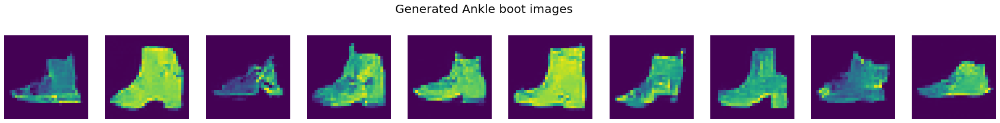

In [69]:
#| code-fold: true
#| code-summary: ""
n_samples = 10
label = 'Ankle boot'
condition = dataset.y_name.index(label)
conds = torch.tensor(condition).repeat_interleave(n_samples)

CondDDPMModel.g_scale = None
cond_imgs = CondDDPMModel.generate(n_samples, n_ch=1, sz=32, cb=conds)
show_images(cond_imgs, 1, 10, suptitle=suptitles[3].format(label))

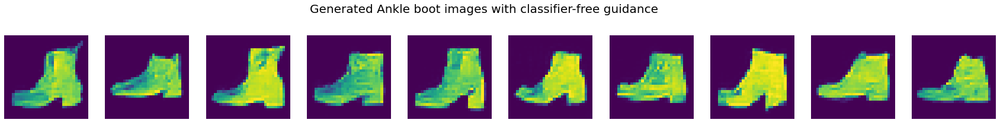

In [71]:
#| code-fold: true
#| code-summary: ""
CondDDPMModel.g_scale = 3.0
cond_guide_imgs = CondDDPMModel.generate(n_samples, n_ch=1, sz=32, cb=conds)
show_images(cond_guide_imgs, 1, 10, suptitle=suptitles[4].format(label))

# Data generation speed

![](stride.png){fig-alt="Strided data generation" fig-align="center"}

One disadvantage of the diffusion model against other gerative model approaches is that its generation is very slow. This is unavoidable because diffusion model requires a lot of update steps ($T$) and model inferences to finish a single generation. One direct solution is to decrease the number of update steps $T$. For example, DDIM showed that it could achive a good balance of the data quality and generation speed with the reverse diffusion step of stride > 1 [@nichol2021improved].

![](ldm.png){fig-alt="Latent diffusion model" fig-align="center"}

Another method to improve the generation speed is to make the reverse diffusion process work on a small-scale compressed form of data. LDM (Latent Diffusion Model) [@rombach2022highresolution] and Stable Diffusion (Improved version of LDM) follows this approach. It has an additional model to compress/downscale and to uncompress/upscale to original data. Then the typical diffusion process is applied to the compressed/downscaled data, which alleviates the computaion requirement a lot more than when it's applied to the origial form of data.


In [ ]:
#| code-fold: true
#| code-summary: Code (Strided noise scheduler)

class FastEtaTunedScheduler(EtaTunedScheduler):
    def __init__(self, stride, **kwargs):
        super().__init__(**kwargs)
        
        # stride > 1 will make scheduler faster 
        self.stride = stride
        self.ts = list(range(1, self.max_t + 1, stride))
        
    def _prev_t(self, t):
        return t - self.stride

    
# StridedDDIMScheduler = FastEtaTunedScheduler(
#     stride = 20, max_t = NUM_TIMESTEPS, betas=betas, eta=0.0)


# # Use DDIMScheduler with a fixed seed to generate same images
# DDIMModel.noise_scheduler = DDIMScheduler
# %time imgs1 = DDIMModel.generate(100, 1, 32, seed=torch.manual_seed(0))
# DDIMModel.noise_scheduler = StridedDDIMScheduler
# %time imgs2 = DDIMModel.generate(100, 1, 32, seed=torch.manual_seed(0))

In [211]:
#| code-fold: true
#| code-summary: ""

# DDIMModel.noise_scheduler = DDIMScheduler
# # Sampled at 10 steps
# data = DDIMModel.generate(8, 1, 32, 
#                           seed=torch.manual_seed(0), return_intermediates=True)
# _, (imgs1_ts, imgs1) = data
# suffixes1 = [f'(t = {t})' for t in imgs1_ts]

# plt.clf()
# imgs1_ani = animate_images(imgs1, 1, suptitle=suptitles[5], suffixes=suffixes1)
# HTML(imgs1_ani.to_jshtml())

<Figure size 432x288 with 0 Axes>

In [212]:
#| code-fold: true
#| code-summary: ""

# DDIMModel.noise_scheduler = StridedDDIMScheduler
# # Sampled at 10 steps
# data = DDIMModel.generate(8, 1, 32, 
#                           seed=torch.manual_seed(0), return_intermediates=True)
# _, (imgs2_ts, imgs2) = data
# suffixes2 = [f'(t = {t})' for t in imgs2_ts]

# plt.clf()
# imgs2_ani = animate_images(imgs2, 1, suptitle=suptitles[6], suffixes=suffixes2)
# HTML(imgs2_ani.to_jshtml())

<Figure size 432x288 with 0 Axes>

# Summary

To summarise what's covered,

- The diffusion process is a theoretical foundation of the diffusion model. Its forward process is used to train a noise predictor and the reverse process to generate data from a random noise.
- The diffusion model has two components.
    - Noise_scheduler to apply the foward/reverse diffusion process to data.
    - Neural network based model to predict an added noise of the diffused data in the reverse (denoising) process.
- Conditional model or guidance technique can be used to generate the data of want, not a random one.
- Diffusion model is inherently slower than other generative models because it requires multiple model inferences (noise predictions) to generate data. Strided reverse diffusion process or latent diffusion model are the approaches to overcome the speed limitation.


## Nobility vs Memorisation

![Generated pokemon sprites (blue-box: noble+memorised sample, red-box: memorised sample, others: noble sample)](pokemons.png)

There could be a question, 

"Okay, the diffusion model seems to be able to generate something that looks real, but isn't it just one of the data the model has already seen? It doesn't seem to have any special component that helps to create a noble one. How can it be useful if it just copies and pastes one of the data it has seen during training?"

It is true that the diffusion model memorises non-diffused data to do a denoising step effectively. The memorisation of a whole sample happens. However, that's not the only thing that the model learns. Inductive bias of a neural network plus a sauce of randomness helps learn the common parts/characteristics of multiple samples as well. As a result, the model will not only copy the data but also generate a noble new sample. This seems analogus to how human creativity comes out of knowledge with a few memory errors.


# References

::: {#refs}
:::